In [6]:
!pip install tensorflow

In [7]:
import os, json, numpy as np, cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Conv2D, UpSampling2D, BatchNormalization, Activation

In [8]:
IMAGE_DIR = "/content/images"
MASK_DIR = "/content/masks"
METADATA_FILE = "/content/metadata.json"


In [9]:
def build_dataset(metadata):
    dataset = []
    for entry in metadata:
        image_id = entry['image_id']
        img_path = os.path.join(IMAGE_DIR, f"{image_id}.jpg")
        if not os.path.exists(img_path):
            continue
        # Binary label: 1 if any aneurysm, else 0
        label = 1 if entry['anomalies']['aneurysm'] else 0
        dataset.append((img_path, label))
    return dataset

# Load metadata from JSON
with open(METADATA_FILE, 'r') as f:
    metadata = json.load(f)

dataset = build_dataset(metadata)


In [10]:
# --- 3. Data Splitting ---
train_val, test = train_test_split(dataset, test_size=0.15, stratify=[l for _, l in dataset], random_state=42)
train, val = train_test_split(train_val, test_size=0.176, stratify=[l for _, l in train_val], random_state=42)  # ~=15%
print(f"Train: {len(train)}, Val: {len(val)}, Test: {len(test)}")


Train: 350, Val: 75, Test: 75


In [11]:
# --- 4. Image Preprocessing ---
def load_image(path, target_size=(224,224)):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, target_size).astype(np.float32) / 255.0
    return np.stack([img]*3, axis=-1)

In [12]:
# Prepare NumPy arrays
def prepare_split(data):
    X, y = [], []
    for path, label in data:
        X.append(load_image(path))
        y.append(label)
    return np.array(X), np.array(y)

X_train, y_train = prepare_split(train)
X_val, y_val     = prepare_split(val)
X_test, y_test   = prepare_split(test)


In [13]:
# --- 7. Build Model ---
def build_model(input_shape=(224,224,3)):
    base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    x = GlobalAveragePooling2D()(base.output)
    output = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base.input, outputs=output)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

model = build_model()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [14]:
# --- 6. Training ---
history = model.fit(
    X_train, y_train,
    epochs=10,
    batch_size=32,
    validation_data=(X_val, y_val)
)

Epoch 1/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 276s 20s/step - accuracy: 0.7284 - loss: 0.8316 - val_accuracy: 0.8800 - val_loss: 127468.5469
Epoch 2/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 221s 20s/step - accuracy: 0.8653 - loss: 0.7054 - val_accuracy: 0.1200 - val_loss: 292915.0000
Epoch 3/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 254s 19s/step - accuracy: 0.8918 - loss: 0.2978 - val_accuracy: 0.1200 - val_loss: 631.2166
Epoch 4/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 265s 20s/step - accuracy: 0.8873 - loss: 0.3003 - val_accuracy: 0.8800 - val_loss: 27.2360
Epoch 5/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 208s 19s/step - accuracy: 0.8961 - loss: 0.2031 - val_accuracy: 0.8800 - val_loss: 0.5118
Epoch 6/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 273s 20s/step - accuracy: 0.9121 - loss: 0.1633 - val_accuracy: 0.8800 - val_loss: 0.4121
Epoch 7/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 215s 20s/step - accuracy: 0.9307 - loss: 0.1663 - val_accuracy: 0.1200 - val_loss: 1.1552
Epoch 8/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 265s 20s/step - accuracy: 0.9379 - loss: 0.1677 - val

In [19]:
# --- 7. Evaluation & Visualization ---
# Classification report
y_pred_prob = model.predict(X_test)
y_pred = (y_pred_prob > 0.5).astype(int).flatten()
print(classification_report(y_test, y_pred))
print(y_pred)

3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step
              precision    recall  f1-score   support

           0       0.88      1.00      0.94        66
           1       0.00      0.00      0.00         9

    accuracy                           0.88        75
   macro avg       0.44      0.50      0.47        75
weighted avg       0.77      0.88      0.82        75

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


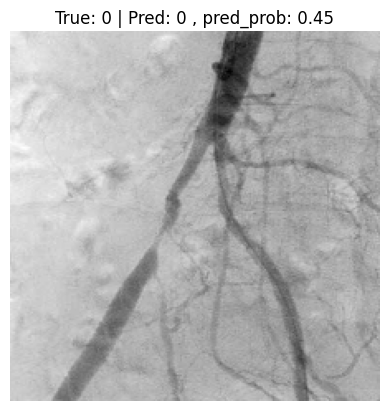

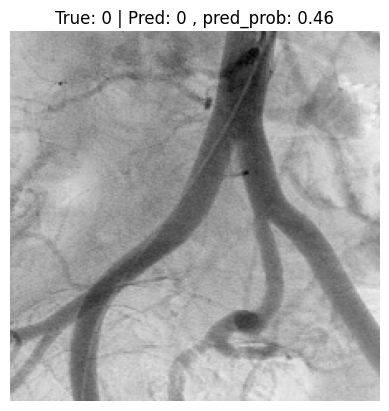

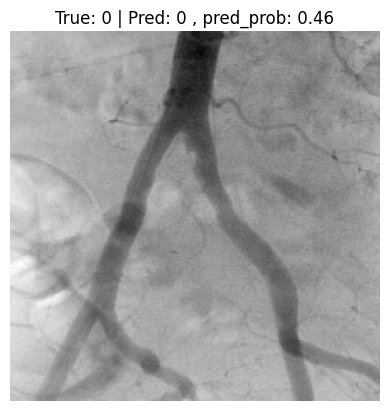

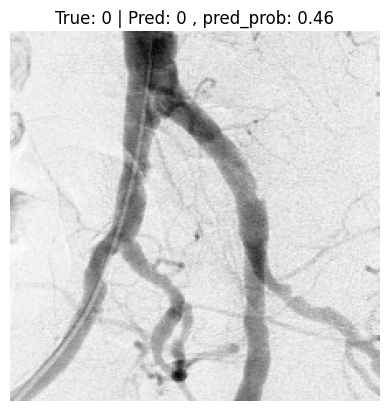

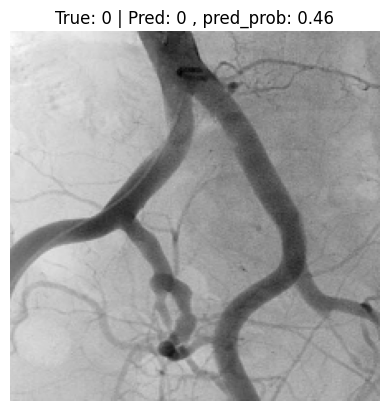

...

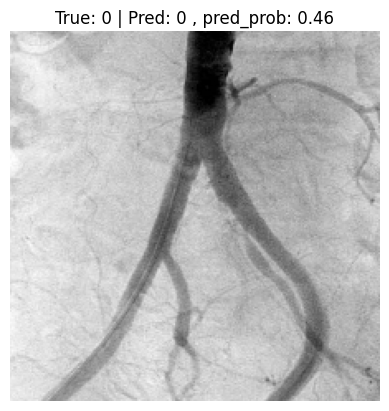

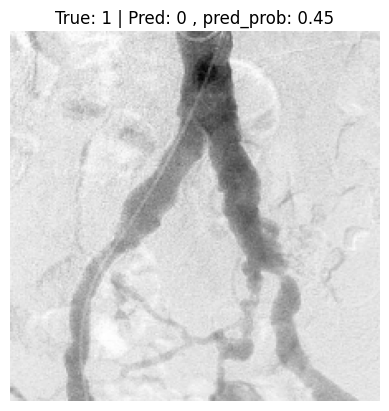

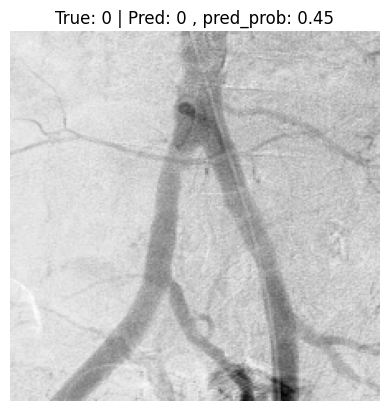

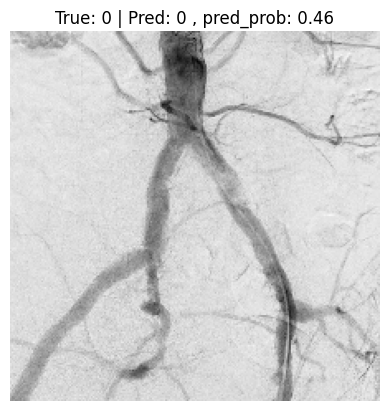

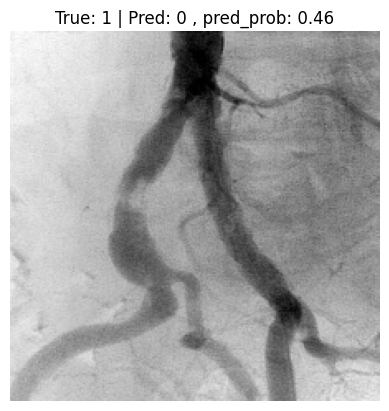

In [18]:
def show_prediction(img, true_label, pred_prob, pred):
    plt.imshow(img[...,0], cmap='gray')
    plt.title(f"True: {true_label} | Pred: {pred} , pred_prob: {pred_prob:.2f}")
    plt.axis('off')
    plt.show()

# Display ALL test images with predictions
for idx in range(len(X_test)):
    show_prediction(X_test[idx], y_test[idx], y_pred_prob[idx][0], y_pred[idx])


In [21]:
# --- 9. Save Model ---
model.save('resnet50_aneurysm_binary.keras')
